# **🏠 부동산 실거래가 예측 대회**


## 1. 라이브러리 임포트

In [ ]:
!pip install eli5==0.13.0

# 한글 폰트 사용을 위한 라이브러리입니다.
!apt-get install -y fonts-nanum

In [ ]:
!pip install dataprep

In [1]:
# visualization
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
fe = fm.FontEntry(
    # colab 환경 
    # fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
    # 로컬 환경
    fname=r'./NanumGothic.ttf', # ttf 파일이 저장되어 있는 경로
    name='NanumBarunGothic')                        # 이 폰트의 원하는 이름 설정
fm.fontManager.ttflist.insert(0, fe)              # Matplotlib에 폰트 추가
plt.rcParams.update({'font.size': 10, 'font.family': 'NanumBarunGothic'}) # 폰트 설정
plt.rc('font', family='NanumBarunGothic')
import seaborn as sns

# EDA
# from dataprep.eda import create_report

# utils
import gdown
import pandas as pd
import numpy as np
from tqdm import tqdm
import pickle
import warnings;warnings.filterwarnings('ignore')
import re
import math

# Model
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import lightgbm as lgb
from sklearn import metrics

# import eli5
# from eli5.sklearn import PermutationImportance

## 2. 데이터 불러오기

In [ ]:
# # colab 환경
# from google.colab import drive
# drive.mount('/content/drive')

# data_path = '/content/drive/MyDrive/Colab Notebooks/data/'

In [2]:
# 로컬 환경
data_path = './data/'

In [9]:
# 필요한 데이터를 load 하겠습니다. 경로는 환경에 맞게 지정해주면 됩니다.
train_path = data_path + 'train.csv'
test_path  = data_path + 'test.csv'
original_train_df = pd.read_csv(train_path, encoding='utf-8', low_memory=False)
test_df = pd.read_csv(test_path, encoding='utf-8', low_memory=False)

In [10]:
# Train data와 Test data shape은 아래와 같습니다.
print('Train data shape : ', original_train_df.shape, 'Test data shape : ', test_df.shape)

Train data shape :  (1118822, 52) Test data shape :  (9272, 51)


In [8]:
# Train과 Test data를 살펴보겠습니다.
display(original_train_df.head(1))
display(test_df.head(1))      # 부동산 실거래가(=Target) column이 제외된 모습입니다.

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,201712,8,3,1987,...,4858.0,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0,124000


,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,청소비관리형태,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일
0,서울특별시 강남구 개포동,658-1,658.0,1.0,개포6차우성,79.97,202307,26,5,1987,...,직영,4858.0,262.0,임의,2022-11-17 13:00:29.0,Y,N,127.05721,37.476763,2022-11-17 10:19:06.0


In [3]:
np.setdiff1d(original_train_df.columns, test_df.columns)

array(['target'], dtype=object)

## 3. 데이터 살펴보기

#### 3.1. 데이터 정보 확인

In [10]:
original_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1118822 entries, 0 to 1118821
Data columns (total 52 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   시군구                     1118822 non-null  object 
 1   번지                      1118597 non-null  object 
 2   본번                      1118747 non-null  float64
 3   부번                      1118747 non-null  float64
 4   아파트명                    1116696 non-null  object 
 5   전용면적(㎡)                 1118822 non-null  float64
 6   계약년월                    1118822 non-null  int64  
 7   계약일                     1118822 non-null  int64  
 8   층                       1118822 non-null  int64  
 9   건축년도                    1118822 non-null  int64  
 10  도로명                     1118822 non-null  object 
 11  해제사유발생일                 5983 non-null     float64
 12  등기신청일자                  1118822 non-null  object 
 13  거래유형                    1118822 non-null  object 
 14  중개

In [11]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9272 entries, 0 to 9271
Data columns (total 51 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   시군구                     9272 non-null   object 
 1   번지                      9270 non-null   object 
 2   본번                      9272 non-null   float64
 3   부번                      9272 non-null   float64
 4   아파트명                    9262 non-null   object 
 5   전용면적(㎡)                 9272 non-null   float64
 6   계약년월                    9272 non-null   int64  
 7   계약일                     9272 non-null   int64  
 8   층                       9272 non-null   int64  
 9   건축년도                    9272 non-null   int64  
 10  도로명                     9272 non-null   object 
 11  해제사유발생일                 212 non-null    float64
 12  등기신청일자                  9272 non-null   object 
 13  거래유형                    9272 non-null   object 
 14  중개사소재지                  9272 non-null   

#### 3.2. 데이터 요약 통계량 확인

In [12]:
original_train_df.describe(include='all')

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target
count,1118822,1118597,1.118747e+06,1.118747e+06,1116696,1.118822e+06,1.118822e+06,1.118822e+06,1.118822e+06,1.118822e+06,...,2.491080e+05,249108.000000,249259,248536,249259,249259,249152.000000,249152.000000,249197,1.118822e+06
unique,339,6572,NaN,NaN,6538,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4,735,1,2,NaN,NaN,259,NaN
top,서울특별시 노원구 상계동,13,NaN,NaN,현대,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,의무,2013-06-23 12:47:34.0,Y,N,NaN,NaN,2013-03-07 09:46:18.0,NaN
freq,44948,4629,NaN,NaN,16644,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,239198,3028,249259,245117,NaN,NaN,16435,NaN
mean,NaN,NaN,5.649108e+02,5.978885e+00,NaN,7.717475e+01,2.014760e+05,1.580656e+01,8.871968e+00,1.998755e+03,...,1.895070e+05,1063.678778,NaN,NaN,NaN,NaN,126.995228,37.545785,NaN,5.799153e+04
std,NaN,NaN,5.160642e+02,4.668584e+01,NaN,2.936423e+01,4.187868e+02,8.721166e+00,5.982584e+00,9.333908e+00,...,1.729027e+06,1235.437604,NaN,NaN,NaN,NaN,0.091045,0.052483,NaN,4.642602e+04
min,NaN,NaN,0.000000e+00,0.000000e+00,NaN,1.002000e+01,2.007010e+05,1.000000e+00,-4.000000e+00,1.961000e+03,...,0.000000e+00,0.000000,NaN,NaN,NaN,NaN,126.798318,37.447843,NaN,3.500000e+02
25%,NaN,NaN,1.760000e+02,0.000000e+00,NaN,5.965000e+01,2.011100e+05,8.000000e+00,4.000000e+00,1.992000e+03,...,0.000000e+00,315.000000,NaN,NaN,NaN,NaN,126.913157,37.499201,NaN,3.050000e+04
50%,NaN,NaN,4.700000e+02,0.000000e+00,NaN,8.188000e+01,2.015070e+05,1.600000e+01,8.000000e+00,2.000000e+03,...,1.710550e+03,683.000000,NaN,NaN,NaN,NaN,127.014971,37.544936,NaN,4.480000e+04
75%,NaN,NaN,7.810000e+02,1.000000e+00,NaN,8.496000e+01,2.018040e+05,2.300000e+01,1.200000e+01,2.005000e+03,...,8.414210e+03,1274.000000,NaN,NaN,NaN,NaN,127.059590,37.577117,NaN,6.980000e+04


In [13]:
test_df.describe(include='all')

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,청소비관리형태,건축면적,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일
count,9272,9270,9272.000000,9272.000000,9262,9272.000000,9272.000000,9272.000000,9272.000000,9272.000000,...,2699,2.707000e+03,2709.000000,2710,2704,2710,2710,2710.000000,2710.000000,2710
unique,270,1891,NaN,NaN,2170,NaN,NaN,NaN,NaN,NaN,...,4,NaN,NaN,4,567,1,2,NaN,NaN,209
top,서울특별시 노원구 상계동,913,NaN,NaN,현대,NaN,NaN,NaN,NaN,NaN,...,위탁,NaN,NaN,의무,2019-01-04 15:32:37.0,Y,N,NaN,NaN,2013-03-07 09:46:18.0
freq,284,65,NaN,NaN,135,NaN,NaN,NaN,NaN,NaN,...,2495,NaN,NaN,2651,65,2710,2671,NaN,NaN,148
mean,NaN,NaN,615.101920,5.676553,NaN,75.414506,202307.786238,14.967429,10.021031,2003.034944,...,NaN,2.810885e+05,1493.321890,NaN,NaN,NaN,NaN,127.003364,37.543492,NaN
std,NaN,NaN,592.812553,53.852248,NaN,29.343517,0.733229,8.802402,6.653698,11.179837,...,NaN,2.217457e+06,2021.501717,NaN,NaN,NaN,NaN,0.086518,0.049980,NaN
min,NaN,NaN,0.000000,0.000000,NaN,12.000000,202307.000000,1.000000,-3.000000,1961.000000,...,NaN,0.000000e+00,0.000000,NaN,NaN,NaN,NaN,126.798318,37.447843,NaN
25%,NaN,NaN,234.750000,0.000000,NaN,59.700000,202307.000000,8.000000,5.000000,1996.000000,...,NaN,0.000000e+00,431.000000,NaN,NaN,NaN,NaN,126.932044,37.498830,NaN
50%,NaN,NaN,509.000000,0.000000,NaN,76.570000,202308.000000,15.000000,9.000000,2003.000000,...,NaN,4.571390e+03,930.000000,NaN,NaN,NaN,NaN,127.018505,37.545579,NaN
75%,NaN,NaN,816.000000,0.000000,NaN,84.960000,202308.000000,22.000000,14.000000,2012.000000,...,NaN,1.138507e+04,1777.000000,NaN,NaN,NaN,NaN,127.064151,37.575524,NaN


### 3.3 중복 데이터 확인 및 처리

In [14]:
original_train_df[original_train_df.duplicated()].shape

(0, 52)

In [15]:
test_df[test_df.duplicated()].shape

(30, 51)

### 3.4 결측치 탐색

In [11]:
original_train_df.isnull().sum()

시군구                             0
번지                            225
본번                             75
부번                             75
아파트명                         2126
전용면적(㎡)                         0
계약년월                            0
계약일                             0
층                               0
건축년도                            0
도로명                             0
해제사유발생일                   1112839
등기신청일자                          0
거래유형                            0
중개사소재지                          0
k-단지분류(아파트,주상복합등등)         870691
k-전화번호                     870274
k-팩스번호                     872742
단지소개기존clob                1050240
k-세대타입(분양형태)               869563
k-관리방식                     869563
k-복도유형                     869890
k-난방방식                     869563
k-전체동수                     870630
k-전체세대수                    869563
k-건설사(시공사)                 871058
k-시행사                      871254
k-사용검사일-사용승인일              869696
k-연면적                      869563
k-주거전용면적      

In [12]:
test_df.isnull().sum()

시군구                          0
번지                           2
본번                           0
부번                           0
아파트명                        10
전용면적(㎡)                      0
계약년월                         0
계약일                          0
층                            0
건축년도                         0
도로명                          0
해제사유발생일                   9060
등기신청일자                       0
거래유형                         0
중개사소재지                       0
k-단지분류(아파트,주상복합등등)        6582
k-전화번호                    6576
k-팩스번호                    6606
단지소개기존clob                8718
k-세대타입(분양형태)              6562
k-관리방식                    6562
k-복도유형                    6564
k-난방방식                    6562
k-전체동수                    6577
k-전체세대수                   6562
k-건설사(시공사)                6579
k-시행사                     6580
k-사용검사일-사용승인일             6563
k-연면적                     6562
k-주거전용면적                  6562
k-관리비부과면적                 6562
k-전용면적별세대현황(60㎡이하)        6562
k-전용면적별세

In [4]:
# train/test 구분을 위한 칼럼을 하나 만든다.
original_train_df['is_test'] = 0
test_df['is_test'] = 1
train_test_df = pd.concat([original_train_df, test_df])     # 하나의 데이터로 만든다.

In [14]:
train_test_df['is_test'].value_counts()      # train과 test data가 하나로 합쳐진 것을 확인할 수 있다.

0    1118822
1       9272
Name: is_test, dtype: int64

In [20]:
# 실제로 결측치라고 표시는 안되어있지만 아무 의미도 갖지 않는 element들이 아래와 같이 존재.
# 아래 3가지의 경우 모두 아무 의미도 갖지 않는 element가 포함되어 있다.
display(train_test_df['등기신청일자'].value_counts())

            1111271
20230630        585
20230831        496
20230428        394
20230731        374
             ...   
20230105          3
20230125          3
20230109          1
20230102          1
20230104          1
Name: 등기신청일자, Length: 182, dtype: int64

In [21]:
display(train_test_df['거래유형'].value_counts())

-       1086451
중개거래      38123
직거래        3520
Name: 거래유형, dtype: int64

In [22]:
display(train_test_df['중개사소재지'].value_counts())

-                          1090013
서울 노원구                        2627
서울 송파구                        2540
서울 강남구                        2508
서울 강동구                        2038
                            ...   
부산 해운대구, 서울 강남구, 서울 용산구          1
경기 의정부시, 서울 영등포구                 1
서울 노원구, 서울 양천구                   1
광주 동구, 서울 노원구                    1
경기 연천군, 서울 송파구                   1
Name: 중개사소재지, Length: 739, dtype: int64

In [5]:
# 위 처럼 아무 의미도 갖지 않는 칼럼은 결측치와 같은 역할을 하므로, np.nan으로 채워 결측치로 인식되도록 한다.
train_test_df['등기신청일자'] = train_test_df['등기신청일자'].replace(' ', np.nan)
train_test_df['거래유형'] = train_test_df['거래유형'].replace('-', np.nan)
train_test_df['중개사소재지'] = train_test_df['중개사소재지'].replace('-', np.nan)

In [6]:
# EDA에 앞서 결측치를 확인.
train_test_df.isnull().sum()

시군구                             0
번지                            227
본번                             75
부번                             75
아파트명                         2136
전용면적(㎡)                         0
계약년월                            0
계약일                             0
층                               0
건축년도                            0
도로명                             0
해제사유발생일                   1121899
등기신청일자                    1111271
거래유형                      1086451
중개사소재지                    1090013
k-단지분류(아파트,주상복합등등)         877273
k-전화번호                     876850
k-팩스번호                     879348
단지소개기존clob                1058958
k-세대타입(분양형태)               876125
k-관리방식                     876125
k-복도유형                     876454
k-난방방식                     876125
k-전체동수                     877207
k-전체세대수                    876125
k-건설사(시공사)                 877637
k-시행사                      877834
k-사용검사일-사용승인일              876259
k-연면적                      876125
k-주거전용면적      

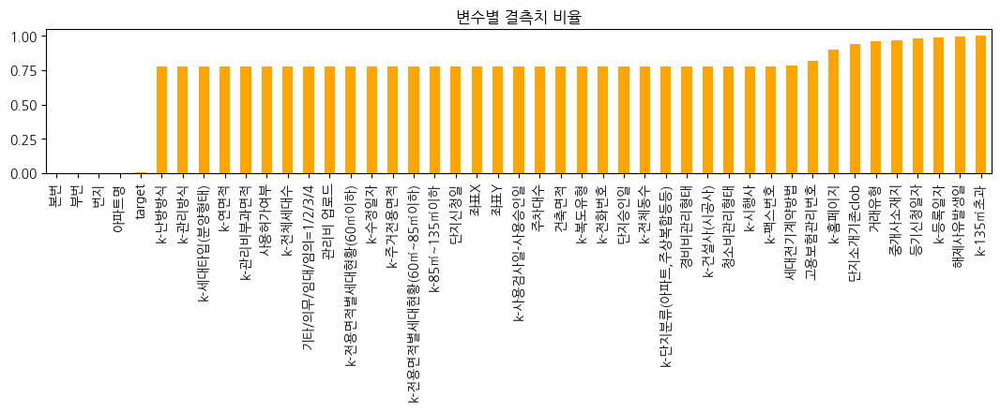

In [25]:
# 변수별 결측치의 비율을 plot으로 그려보면 아래와 같다.
fig = plt.figure(figsize=(13, 2))
missing = train_test_df.isnull().sum() / train_test_df.shape[0]
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar(color='orange')
plt.title('변수별 결측치 비율')
plt.show()

- 위 그래프에서 볼 수 있다시피 결측치가 100만개 이상인 칼럼들은 결측치가 해당 칼럼의 element 중 90% 이상을 차지하는 상황이 되기에 해당 칼럼들은 예측에 도움이 되지 않는다고 판단해 삭제해주도록 한다.

In [26]:
# Null값이 100만개 이상인 칼럼은 삭제한다.
print('* 결측치가 100만개 이하인 변수들 :', list(train_test_df.columns[train_test_df.isnull().sum() <= 1000000]))     # 남겨질 변수들은 아래와 같습니다.
print('* 결측치가 100만개 이상인 변수들 :', list(train_test_df.columns[train_test_df.isnull().sum() >= 1000000]))

* 결측치가 100만개 이하인 변수들 : ['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월', '계약일', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target', 'is_test']
* 결측치가 100만개 이상인 변수들 : ['해제사유발생일', '등기신청일자', '거래유형', '중개사소재지', '단지소개기존clob', 'k-135㎡초과', 'k-홈페이지', 'k-등록일자']


In [27]:
train_test_df[train_test_df.columns[train_test_df.isnull().sum() <= 1000000]].isnull().sum()

시군구                            0
번지                           227
본번                            75
부번                            75
아파트명                        2136
전용면적(㎡)                        0
계약년월                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        877273
k-전화번호                    876850
k-팩스번호                    879348
k-세대타입(분양형태)              876125
k-관리방식                    876125
k-복도유형                    876454
k-난방방식                    876125
k-전체동수                    877207
k-전체세대수                   876125
k-건설사(시공사)                877637
k-시행사                     877834
k-사용검사일-사용승인일             876259
k-연면적                     876125
k-주거전용면적                  876170
k-관리비부과면적                 876125
k-전용면적별세대현황(60㎡이하)        876170
k-전용면적별세대현황(60㎡~85㎡이하)    876170
k-85㎡~135㎡이하              876170
k-수정일자                    876170
고용보험관리번호  

#### 3.4.1. 아파트명 확인

- train 데이터의 아파트명에 번지값이 있는 것들이 있음

In [28]:
print(f"train 아파트명 unique(include na) 수: {original_train_df['아파트명'].nunique(dropna=False)}")
print(f"test 아파트명 unique(include na) 수: {test_df['아파트명'].nunique(dropna=False)}")

train 아파트명 unique(include na) 수: 6539
test 아파트명 unique(include na) 수: 2171


In [29]:
non_na_apt_train_df = original_train_df.loc[original_train_df['아파트명'].dropna().index]
non_na_apt_train_df.loc[non_na_apt_train_df['아파트명'].str.contains('-'), '아파트명'].unique()

array(['e-편한세상', '청담2차이-편한세상', '청담3차이-편한세상', '청담4차이-편한세상', '청담대림이-편한세상',
       '성내1차e-편한세상', '성내2차e-편한세상', '성내3차e-편한세상', '천호e-편한세상',
       '가양도시개발9-2단지', '대림e-편한세상', '자양강변I-Park', 'LIPe-푸른', '800-19',
       '800-22', '807-41', '대림e-편한세상4', '대림e-편한세상5', '대림e-편한세상6',
       '대림e-편한세상7', '뉴-동부', '중흥에스-클래스', 'U-포그니', '대방1차e-편한세상',
       '대방2차e-편한세상', '성산2차e-편한세상', '3RU-City', '대림e-편한세상1', '방배2차e-편한세상',
       '방배3차e-편한세상', '방배아트e-편한세상103', 'N-Suite', 'N-Suite101동',
       '서초1차e-편한세상', '서초2차e-편한세상', '서초중흥S-클래스', '프레스턴-2', '더-클라스',
       'E-아름다운세상', '현대I-PARK', '정릉2차e-편한세상', '정릉e-편한세상', '신한에스빌-미지엔',
       '청공빌딩주상복합-현대빌리지', '에스-탑', '파크인-수', '송파N-suite', '목동동화옥시죤-7',
       '목동이-편한세상', '로얄카운티-3', '갈현1단지e-편한세상', '용산파크e-편한세상', '대림e-편한세상2',
       '구파발10단지어울림BL3-1', '구파발9단지래미안BL3-2', '마고정3단지센트레빌BL2-11',
       '마고정3단지센트레빌BL2-3', '마고정3단지센트레빌BL2-2', '박석고개1단지힐스테이트BL2-12',
       '박석고개1단지힐스테이트BL2-13', '박석고개1단지힐스테이트BL2-1', '상림마을6단지푸르지오BL1-8',
       '상림마을6단지푸르지오BL1-7', '상림마을6단지푸르지오BL1-6', '상림마을

In [30]:
non_na_apt_test_df = test_df.loc[test_df['아파트명'].dropna().index]
non_na_apt_test_df.loc[non_na_apt_test_df['아파트명'].str.contains('-'), '아파트명'].unique()

array(['e-편한세상', '청담2차이-편한세상', '청담대림이-편한세상', '성내1차e-편한세상', '천호e-편한세상',
       '가양도시개발9-2단지', '대림e-편한세상4', '대림e-편한세상5', '중흥에스-클래스', '대림e-편한세상',
       '성산2차e-편한세상', '대방1차e-편한세상', '방배3차e-편한세상', '더-클라스', '현대I-PARK',
       '정릉2차e-편한세상', '정릉e-편한세상', '목동이-편한세상', '갈현1단지e-편한세상', '용산파크e-편한세상',
       '구파발10단지어울림BL3-1', '구파발9단지래미안BL3-2', '마고정3단지센트레빌BL2-11',
       '마고정3단지센트레빌BL2-3', '마고정3단지센트레빌BL2-2', '박석고개1단지힐스테이트BL2-12',
       '박석고개1단지힐스테이트BL2-13', '박석고개1단지힐스테이트BL2-1', '상림마을6단지푸르지오BL1-7',
       '상림마을7단지아이파크BL1-4', '상림마을7단지아이파크BL1-3', '상림마을7단지아이파크BL1-13',
       '상림마을8단지롯데캐슬BL1-1', '상림마을8단지롯데캐슬BL1-12', '우물골2단지두산위브BL2-5',
       '우물골2단지두산위브BL2-8', '우물골2단지두산위브BL2-7', '우물골2단지두산위브BL2-6',
       '폭포동4단지힐스테이트BL3-9', '폭포동4단지힐스테이트BL3-11'], dtype=object)

In [31]:
# 아파트명에 번지값으로 채운 것들이 존재함 확인
non_na_apt_train_df.loc[non_na_apt_train_df['아파트명'].isin(['800-19', '800-22', '807-41', '800-27', '800-30', '801-14', '801-9', '57-0', '807-39'])].sample(5)

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target,is_test
253088,서울특별시 구로구 구로동,801-14,801.0,14.0,801-14,21.60,202101,26,1,1995,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14200,0
25460,서울특별시 구로구 구로동,800-22,800.0,22.0,800-22,46.41,201804,19,5,2001,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11700,0
979057,서울특별시 구로구 구로동,800-22,800.0,22.0,800-22,46.41,200912,31,1,2001,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13000,0
405540,서울특별시 구로구 구로동,800-27,800.0,27.0,800-27,37.98,201908,17,3,1994,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12200,0
1023665,서울특별시 구로구 구로동,801-14,801.0,14.0,801-14,42.66,200710,23,3,1995,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11100,0


In [32]:
apt_name_only_train = np.setdiff1d(non_na_apt_train_df['아파트명'].unique(), non_na_apt_test_df['아파트명'].unique())
apt_name_only_test = np.setdiff1d(non_na_apt_test_df['아파트명'].unique(), non_na_apt_train_df['아파트명'].unique())
apt_name_intersect = np.intersect1d(non_na_apt_train_df['아파트명'].unique(), non_na_apt_test_df['아파트명'].unique())

print(f'train에만 존재하는 아파트명 갯수: {len(apt_name_only_train)}')
print(f'test에만 존재하는 아파트명 갯수: {len(apt_name_only_test)}')
print(f'train, test 교집합 아파트명 갯수: {len(apt_name_intersect)}')

train에만 존재하는 아파트명 갯수: 4379
test에만 존재하는 아파트명 갯수: 11
train, test 교집합 아파트명 갯수: 2159


In [33]:
del non_na_apt_train_df, non_na_apt_test_df, apt_name_only_train, apt_name_only_test, apt_name_intersect

### 3.5 EDA & 시각화

DataPrep Report
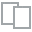
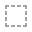
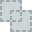
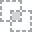
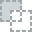
...
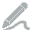
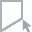
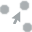
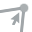
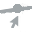

In [ ]:
create_report(train_test_df[selected])

## 4. Data Preprocessing

- 모델링 전에 데이터 내 결측치, 이상치 등을 제거하고 범주형과 연속형 변수를 살펴보도록 하겠습니다!
- 먼저, 용이한 전처리를 위해 train과 test data를 합친 하나의 데이터로 진행하도록 하겠습니다.

### 4.1. 결측치 처리 및 보간
- 결측치를 처리할 때 많이 쓰는 방법은 삭제(Deletion)과 대체(Imputation) 입니다.
- 본 Baseline에서는 결측치가 90% 이상을 차지하는 변수의 결측치는 제거하고, 나머지 결측치는 대체하도록 하겠습니다.
  - 연속형 변수의 경우에는 선형보간(Linear interpolation)으로 대체하겠습니다.
  - 범주형 변수의 경우에는 'NULL' 이라는 임의의 범주로 대체해주도록 하겠습니다.

- 참고 ✅
  - 선형보간(Linear interpolation)이란 두 점의 값이 주어졌을 때 **그 사이의 값**을 추정하기 위해 직선 거리에 따라 선형적으로 계산하는 방법입니다.
  - 아래 두개의 붉은 점 사이에 ($x$, $y$) 값을 추정하기 위해, 해당 점이 두 붉은 점을 이은 선형적인 선분에 있다고 가정하고, 단순 비례식으로 ($x$, $y$)를 추정해 보간하는 방법입니다.
  - [참고자료](https://ko.wikipedia.org/wiki/%EC%84%A0%ED%98%95_%EB%B3%B4%EA%B0%84%EB%B2%95#:~:text=%EC%84%A0%ED%98%95%20%EB%B3%B4%EA%B0%84%EB%B2%95(%E7%B7%9A%E5%9E%8B%E8%A3%9C%E9%96%93%E6%B3%95,%EC%9C%BC%EB%A1%9C%20%EA%B3%84%EC%82%B0%ED%95%98%EB%8A%94%20%EB%B0%A9%EB%B2%95%EC%9D%B4%EB%8B%A4.)


> 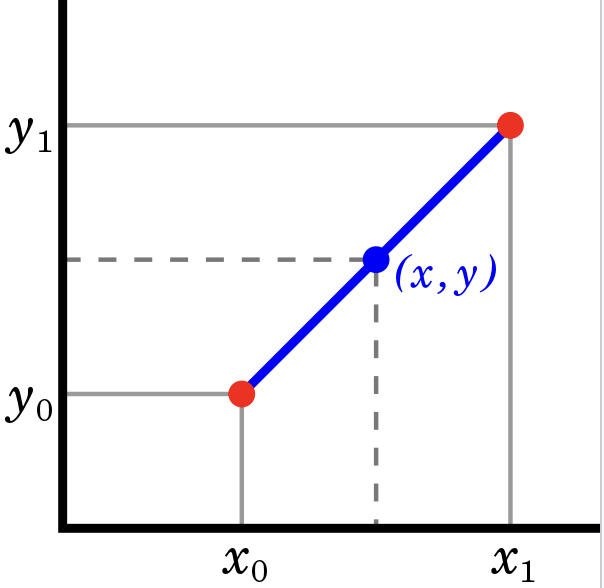

In [7]:
# 위에서 결측치가 100만개 이하인 변수들만 골라 저장.
selected = list(train_test_df.columns[train_test_df.isnull().sum() <= 1000000])
print(f'결측치 100만 이하 변수 갯수: {len(selected)}')
print(selected)

결측치 100만 이하 변수 갯수: 45
['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '계약년월', '계약일', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target', 'is_test']


In [8]:
# 위에서 결측치가 100만개 이하인 변수들만 골라 새로운 modified_train_test_df 객체로 저장해줍니다.
modified_train_test_df = train_test_df[selected].copy()
modified_train_test_df.shape

(1128094, 45)

In [9]:
modified_train_test_df.isnull().sum()     # 결측치가 100만개 초과인 칼럼이 제거된 모습은 아래와 같습니다.
# target변수는 test dataset 개수만큼(9272) 결측치가 존재함을 확인할 수 있습니다.

시군구                            0
번지                           227
본번                            75
부번                            75
아파트명                        2136
전용면적(㎡)                        0
계약년월                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        877273
k-전화번호                    876850
k-팩스번호                    879348
k-세대타입(분양형태)              876125
k-관리방식                    876125
k-복도유형                    876454
k-난방방식                    876125
k-전체동수                    877207
k-전체세대수                   876125
k-건설사(시공사)                877637
k-시행사                     877834
k-사용검사일-사용승인일             876259
k-연면적                     876125
k-주거전용면적                  876170
k-관리비부과면적                 876125
k-전용면적별세대현황(60㎡이하)        876170
k-전용면적별세대현황(60㎡~85㎡이하)    876170
k-85㎡~135㎡이하              876170
k-수정일자                    876170
고용보험관리번호  

In [ ]:
del original_train_df, test_df, train_test_df

##### 4.1.1. 특정값 대체

- 본번 & 부번

In [10]:
modified_train_test_df[['번지', '본번', '부번', '도로명', '아파트명']][modified_train_test_df['도로명'].str.contains('-')]

,번지,본번,부번,도로명,아파트명
1063,1164-30,1164.0,30.0,논현로2길 61-4,뉴현대파크빌
1241,1260-2,1260.0,2.0,개포로31길 9-9,우찬현대
1242,1260-2,1260.0,2.0,개포로31길 9-9,우찬현대
1243,1260-4,1260.0,4.0,개포로31길 9-5,우찬현대
1299,103-11,103.0,11.0,도산대로54길 48-8,골든캐슬
...,...,...,...,...,...
8847,82,82.0,0.0,통일로 246-20,현대
8916,888,888.0,0.0,숭인동1나길 11-7,오성
8966,432-904,432.0,904.0,동호로11마길 20-8,NaN
9000,432-2164,432.0,2164.0,동호로17길 256-35,도현블랑빌


In [10]:
# 아파트명이 '힐스테이트 서초 젠트리스'인 데이터는 train에만 존재.
modified_train_test_df.loc[(modified_train_test_df['아파트명'] == '힐스테이트 서초 젠트리스') & (modified_train_test_df['is_test'] == 1)]

,시군구,번지,본번,부번,아파트명,전용면적(㎡),계약년월,계약일,층,건축년도,...,주차대수,기타/의무/임대/임의=1/2/3/4,단지승인일,사용허가여부,관리비 업로드,좌표X,좌표Y,단지신청일,target,is_test


In [11]:
# train에만 존재하는 아파트명이 '힐스테이트 서초 젠트리스'인 75개 번지, 본번, 부번의 누락으로 검색하여 대체 가능
modified_train_test_df['번지'] = np.where(modified_train_test_df['아파트명'] == '힐스테이트 서초 젠트리스', '557', modified_train_test_df['번지'])
modified_train_test_df['본번'].fillna(557, inplace=True)
modified_train_test_df['부번'].fillna(0, inplace=True)

In [12]:
modified_train_test_df[['번지', '본번', '부번']].isnull().sum()

번지    152
본번      0
부번      0
dtype: int64

- 번지

In [13]:
# train과 test에 모두 존재하는 아파트명이 '서초포레스타2단지'인 150개 번지의 누락으로 검색하여 대체 가능
modified_train_test_df['번지'] = np.where(modified_train_test_df['아파트명'] == '서초포레스타2단지', '384', modified_train_test_df['번지'])

In [14]:
modified_train_test_df['번지'].isnull().sum()

0

- 그외 결측치 데이터는 '서울시 공동주택 정보' 활용하여 대체

In [15]:
apt_info = pd.read_csv(data_path + '서울시 공동주택 아파트 정보.csv', encoding='euc-kr', index_col=0)

# apt_info의 도로명에는 서울특별시 ~구 가 들어가있기 때문에 정리한 후에, train데이터와 apt_info의 도로명이 겹쳐지는 것이 있는지 확인한다.
apt_info['도로명'] = apt_info['kapt도로명주소'].map(lambda x: ' '.join(str(x).split(" ")[2:]) if pd.notnull(x) else np.nan)
apt_info = apt_info.drop_duplicates(subset=['도로명'], keep='first')

set1 = set(apt_info['도로명'])
set2 = set(modified_train_test_df['도로명'])

len(set2.intersection(set1))

2339

In [16]:
# 대체 전 결측치 확인
modified_train_test_df.isnull().sum()

시군구                            0
번지                             0
본번                             0
부번                             0
아파트명                        2136
전용면적(㎡)                        0
계약년월                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        877273
k-전화번호                    876850
k-팩스번호                    879348
k-세대타입(분양형태)              876125
k-관리방식                    876125
k-복도유형                    876454
k-난방방식                    876125
k-전체동수                    877207
k-전체세대수                   876125
k-건설사(시공사)                877637
k-시행사                     877834
k-사용검사일-사용승인일             876259
k-연면적                     876125
k-주거전용면적                  876170
k-관리비부과면적                 876125
k-전용면적별세대현황(60㎡이하)        876170
k-전용면적별세대현황(60㎡~85㎡이하)    876170
k-85㎡~135㎡이하              876170
k-수정일자                    876170
고용보험관리번호  

In [17]:
# 두 데이터에서 공통된 열을 추출한다.
set1 = set(apt_info.columns)
set2 = set(modified_train_test_df.columns)
columns = set2.intersection(set1)

# 두 데이터를 병합한다. 이렇게 병합하면 중복되는 열들의 이름에 suffixes들이 달리고, 데이터는 원본은 각 원본을 유지한다.
merged_dt = pd.merge(modified_train_test_df, apt_info, on='도로명', how='left', suffixes=('_df1', '_df2'))

# 각 열에 대해 _df1 열의 NaN 값을 _df2 열의 값으로 대체 - combine_first로 보완이 가능하다.
for col in list(columns):
    if col != '도로명':
        merged_dt[col] = merged_dt[f'{col}_df1'].combine_first(merged_dt[f'{col}_df2'])

merged_dt = merged_dt[modified_train_test_df.columns]

In [18]:
modified_train_test_df = merged_dt.copy()
# 대체 후 결측치 확인
modified_train_test_df.isnull().sum()

del apt_info, set1, set2, columns, merged_dt

시군구                            0
번지                             0
본번                             0
부번                             0
아파트명                        2136
전용면적(㎡)                        0
계약년월                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        258830
k-전화번호                    257748
k-팩스번호                    267442
k-세대타입(분양형태)              257023
k-관리방식                    257023
k-복도유형                    257352
k-난방방식                    257023
k-전체동수                    258881
k-전체세대수                   257084
k-건설사(시공사)                260349
k-시행사                     260733
k-사용검사일-사용승인일             257157
k-연면적                     257023
k-주거전용면적                  257129
k-관리비부과면적                 257023
k-전용면적별세대현황(60㎡이하)        257129
k-전용면적별세대현황(60㎡~85㎡이하)    257129
k-85㎡~135㎡이하              257129
k-수정일자                    257068
고용보험관리번호  

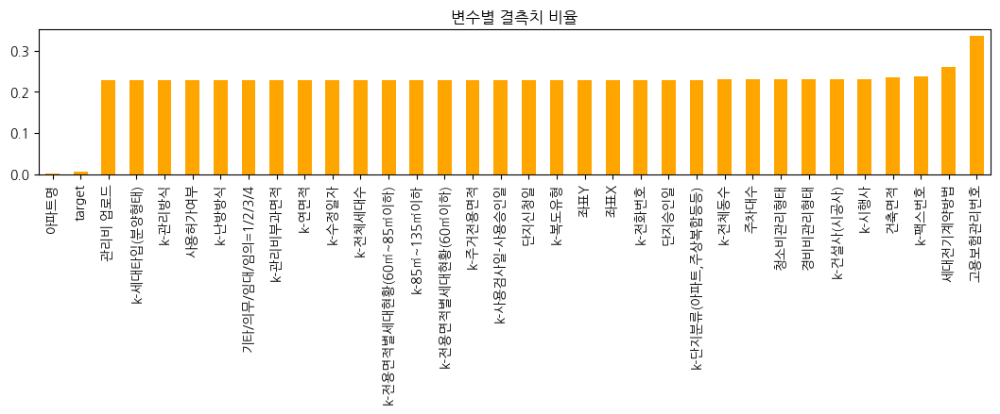

In [49]:
# 변수별 결측치의 비율을 plot으로 다시 그려보면 아래와 같다.
fig = plt.figure(figsize=(13, 2))
missing = modified_train_test_df.isnull().sum() / modified_train_test_df.shape[0]
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot.bar(color='orange')
plt.title('대체처리 후 변수별 결측치 비율')
plt.show()

- X & Y 좌표
    - 향후 교통정보에 활용되는 위치 정보이기에 '시군구' 와 '도로명' 을 통해 KAKAO_API로 데이터 보강

In [64]:
# 대체 전 결측치 확인
modified_train_test_df[['아파트명', '좌표X', '좌표Y']].isnull().sum()

아파트명      2136
좌표X     257393
좌표Y     257393
dtype: int64

In [49]:
train_coordinates = pd.read_csv(data_path + 'train_cho_1.csv')
test_coordinates = pd.read_csv(data_path + 'test_cho_1.csv')
print(train_coordinates.shape)
print(test_coordinates.shape)

train_coordinates = train_coordinates[['아파트명', '좌표X', '좌표Y']]
test_coordinates = test_coordinates[['아파트명', '좌표X', '좌표Y']]
print(train_coordinates.shape)
print(test_coordinates.shape)

(1118822, 20)
(9272, 19)
(1118822, 3)
(9272, 3)


In [59]:
def imputate_missing_value_by_api(df1, df2):
    # 두 데이터를 index를 기준으로 병합한다. 이렇게 병합하면 중복되는 열들의 이름에 suffixes들이 달리고, 데이터는 원본은 각 원본을 유지한다.
    merged_dt = df1.join(df2, how='left', lsuffix='_df1', rsuffix='_df2')
    
    # 각 열에 대해 _df1 열의 NaN 값을 _df2 열의 값으로 대체 - combine_first로 보완이 가능하다.
    for col in df2.columns:
        merged_dt[col] = merged_dt[f'{col}_df1'].combine_first(merged_dt[f'{col}_df2'])

    return merged_dt[df1.columns]

In [60]:
modified_train_df = imputate_missing_value_by_api(modified_train_test_df.query('is_test == 0'), train_coordinates)
modified_test_df = imputate_missing_value_by_api(modified_train_test_df.query('is_test == 1'), test_coordinates)
print(modified_train_df.shape)
print(modified_test_df.shape)

(1118822, 45)
(9272, 45)


In [67]:
modified_train_test_df = pd.concat([modified_train_df, modified_test_df])
print(modified_train_test_df.shape)

modified_train_df[['아파트명', '좌표X', '좌표Y']].isnull().sum()

(1128094, 45)


아파트명     1547
좌표X     23944
좌표Y     23944
dtype: int64

In [71]:
del train_coordinates, test_coordinates, modified_train_df, modified_test_df

- 아파트명
    - 결측치 탐색의 결과로, 번지로 대체

In [68]:
modified_train_test_df['아파트명'].fillna(modified_train_test_df['번지'], inplace=True)

In [69]:
modified_train_test_df.isnull().sum()

시군구                            0
번지                             0
본번                             0
부번                             0
아파트명                           0
전용면적(㎡)                        0
계약년월                           0
계약일                            0
층                              0
건축년도                           0
도로명                            0
k-단지분류(아파트,주상복합등등)        258830
k-전화번호                    257748
k-팩스번호                    267442
k-세대타입(분양형태)              257023
k-관리방식                    257023
k-복도유형                    257352
k-난방방식                    257023
k-전체동수                    258881
k-전체세대수                   257084
k-건설사(시공사)                260349
k-시행사                     260733
k-사용검사일-사용승인일             257157
k-연면적                     257023
k-주거전용면적                  257129
k-관리비부과면적                 257023
k-전용면적별세대현황(60㎡이하)        257129
k-전용면적별세대현황(60㎡~85㎡이하)    257129
k-85㎡~135㎡이하              257129
k-수정일자                    257068
고용보험관리번호  

In [70]:
# 잔여 결측치에 대한 보간 처리 전까지 수행한 전처리 데이터 저장
output_filename = data_path + 'developzest_preprocessed_missing_value_data.csv'
modified_train_test_df.to_csv(output_filename, index=False, encoding='utf-8-sig')

##### 4.1.2. 보간 처리

In [3]:
modified_train_test_df = pd.read_csv(data_path + 'developzest_preprocessed_missing_value_data.csv')

In [4]:
# 연속형 변수는 선형보간을 해주고, 범주형변수는 알수없기에 “unknown”이라고 임의로 보간해 주겠습니다.
modified_train_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128094 entries, 0 to 1128093
Data columns (total 45 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   시군구                     1128094 non-null  object 
 1   번지                      1128094 non-null  object 
 2   본번                      1128094 non-null  float64
 3   부번                      1128094 non-null  float64
 4   아파트명                    1128094 non-null  object 
 5   전용면적(㎡)                 1128094 non-null  float64
 6   계약년월                    1128094 non-null  int64  
 7   계약일                     1128094 non-null  int64  
 8   층                       1128094 non-null  int64  
 9   건축년도                    1128094 non-null  int64  
 10  도로명                     1128094 non-null  object 
 11  k-단지분류(아파트,주상복합등등)      869264 non-null   object 
 12  k-전화번호                  870346 non-null   object 
 13  k-팩스번호                  860652 non-null   object 
 14  k-

In [4]:
# 본번, 부번의 경우 float로 되어있지만 범주형 변수의 의미를 가지므로 object(string) 형태로 바꾸어주고 아래 작업을 진행하겠습니다.
modified_train_test_df['본번'] = modified_train_test_df['본번'].astype('str')
modified_train_test_df['부번'] = modified_train_test_df['부번'].astype('str')

In [6]:
# 먼저, 연속형 변수와 범주형 변수를 위 info에 따라 분리해주겠습니다.
continuous_columns = []
categorical_columns = []

for column in modified_train_test_df.columns:
    if pd.api.types.is_numeric_dtype(modified_train_test_df[column]):
        continuous_columns.append(column)
    else:
        categorical_columns.append(column)

print("연속형 변수:", continuous_columns)
print("범주형 변수:", categorical_columns)

연속형 변수: ['전용면적(㎡)', '계약년월', '계약일', '층', '건축년도', 'k-전체동수', 'k-전체세대수', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target', 'is_test']
범주형 변수: ['시군구', '번지', '본번', '부번', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '단지신청일']


- 연속형 변수와 범주형 변수가 알맞게 나누어졌는지 확인해보고, 이제 각각 보간을 진행합니다.

In [7]:
# 범주형 변수에 대한 보간
modified_train_test_df[categorical_columns] = modified_train_test_df[categorical_columns].fillna('NULL')

# 연속형 변수에 대한 보간 (선형 보간)
modified_train_test_df[continuous_columns] = modified_train_test_df[continuous_columns].interpolate(method='linear', axis=0)

In [8]:
modified_train_test_df.isnull().sum()         # 결측치가 보간된 모습을 확인해봅니다.

시군구                       0
번지                        0
본번                        0
부번                        0
아파트명                      0
전용면적(㎡)                   0
계약년월                      0
계약일                       0
층                         0
건축년도                      0
도로명                       0
k-단지분류(아파트,주상복합등등)        0
k-전화번호                    0
k-팩스번호                    0
k-세대타입(분양형태)              0
k-관리방식                    0
k-복도유형                    0
k-난방방식                    0
k-전체동수                    0
k-전체세대수                   0
k-건설사(시공사)                0
k-시행사                     0
k-사용검사일-사용승인일             0
k-연면적                     0
k-주거전용면적                  0
k-관리비부과면적                 0
k-전용면적별세대현황(60㎡이하)        0
k-전용면적별세대현황(60㎡~85㎡이하)    0
k-85㎡~135㎡이하              0
k-수정일자                    0
고용보험관리번호                  0
경비비관리형태                   0
세대전기계약방법                  0
청소비관리형태                   0
건축면적                      0
주차대수                

In [8]:
modified_train_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128094 entries, 0 to 1128093
Data columns (total 45 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   시군구                     1128094 non-null  object 
 1   번지                      1128094 non-null  object 
 2   본번                      1128094 non-null  object 
 3   부번                      1128094 non-null  object 
 4   아파트명                    1128094 non-null  object 
 5   전용면적(㎡)                 1128094 non-null  float64
 6   계약년월                    1128094 non-null  int64  
 7   계약일                     1128094 non-null  int64  
 8   층                       1128094 non-null  int64  
 9   건축년도                    1128094 non-null  int64  
 10  도로명                     1128094 non-null  object 
 11  k-단지분류(아파트,주상복합등등)      1128094 non-null  object 
 12  k-전화번호                  1128094 non-null  object 
 13  k-팩스번호                  1128094 non-null  object 
 14  k-

- Baseline에서는 단순 결측치들을 제거하거나 보간했지만,
EDA를 통해 변수들의 흐름을 조금 더 파악하고 더 나은 interpolation 등의 방법을 고려해볼 수 있을 것 같습니다.

### 4.2. 데이터 타입 변경

#### 4.2.1. 시계열 데이터 변환

In [10]:
modified_train_test_df.loc[:, ['계약년월', '계약일', 'k-사용검사일-사용승인일', 'k-수정일자', '단지승인일', '단지신청일']]

,계약년월,계약일,k-사용검사일-사용승인일,k-수정일자,단지승인일,단지신청일
0,201712,8,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,2022-11-17 13:00:29.0,2022-11-17 10:19:06.0
1,201712,22,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,2022-11-17 13:00:29.0,2022-11-17 10:19:06.0
2,201712,28,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,2022-11-17 13:00:29.0,2022-11-17 10:19:06.0
3,201801,3,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,2022-11-17 13:00:29.0,2022-11-17 10:19:06.0
4,201801,8,1987-11-21 00:00:00.0,2023-09-23 17:21:41.0,2022-11-17 13:00:29.0,2022-11-17 10:19:06.0
...,...,...,...,...,...,...
1128089,202307,19,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2015-09-09 15:30:27.0,2014-09-01 13:05:03.0
1128090,202307,25,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2015-09-09 15:30:27.0,2014-09-01 13:05:03.0
1128091,202308,27,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2015-09-09 15:30:27.0,2014-09-01 13:05:03.0
1128092,202309,2,2014-06-18 00:00:00.0,2023-09-23 09:00:52.0,2015-09-09 15:30:27.0,2014-09-01 13:05:03.0


In [9]:
modified_train_test_df['계약년월일'] = pd.to_datetime(
    modified_train_test_df['계약년월'].astype('str').map(lambda x: x[:4] + '-' + x[4:])
    + '-'
    + modified_train_test_df['계약일'].astype('str'))

In [10]:
modified_train_test_df.drop(columns=['계약년월', '계약일'], inplace=True)

In [11]:
modified_train_test_df.columns

Index(['시군구', '번지', '본번', '부번', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명',
       'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식',
       'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)', 'k-시행사',
       'k-사용검사일-사용승인일', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)',
       'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', 'k-수정일자', '고용보험관리번호',
       '경비비관리형태', '세대전기계약방법', '청소비관리형태', '건축면적', '주차대수', '기타/의무/임대/임의=1/2/3/4',
       '단지승인일', '사용허가여부', '관리비 업로드', '좌표X', '좌표Y', '단지신청일', 'target',
       'is_test', '계약년월일'],
      dtype='object')

In [12]:
modified_train_test_df['계약년월일'].dtype

dtype('<M8[ns]')

### 4.2. 이상치 처리
- 이번엔 이상치를 처리해봅시다.
- 이상치를 처리하는 방법은 IQR, Z-score 등 다양한 방법이 있습니다. 가장 쉽고 직관적으로 접근하는 방법은 기본 통계치를 이용하는 것입니다.
- 본 baseline에서는 IQR를 이용한 방법을 사용하겠습니다.

##### 4.2.1. 이상치 제거

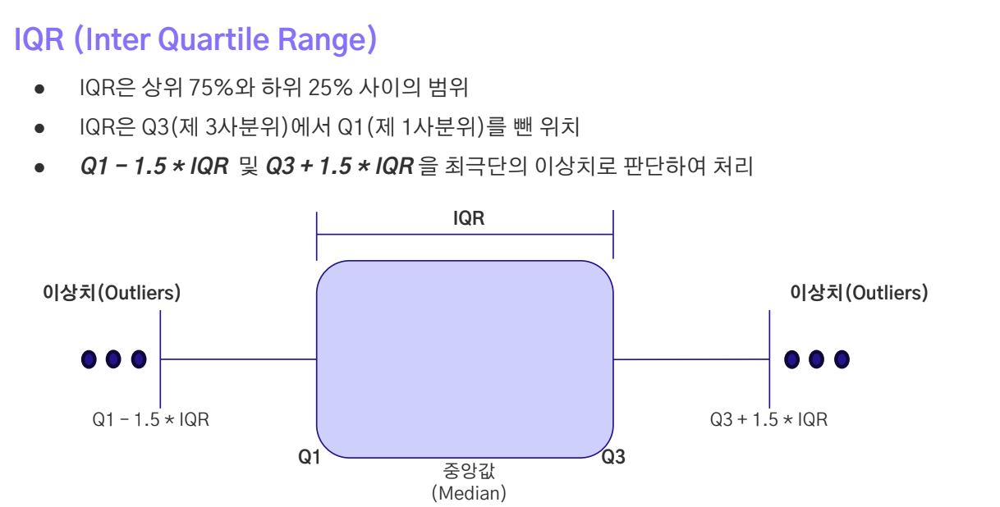

In [15]:
# # 이상치 제거 이전의 shape은 아래와 같습니다.
# print(modified_train_test_df.shape)

In [16]:
# modified_train_test_df = modified_train_test_df.rename(columns={'전용면적(㎡)':'전용면적'})

In [17]:
# # 대표적인 연속형 변수인 “전용 면적” 변수 관련한 분포를 먼저 살펴보도록 하겠습니다.
# fig = plt.figure(figsize=(7, 3))
# sns.boxplot(data = modified_train_test_df, x = '전용면적', color='lightgreen')
# plt.title('전용면적 분포')
# plt.xlabel('Area')
# plt.show()

In [18]:
# # 이상치 제거 방법에는 IQR을 이용하겠습니다.
# def remove_outliers_iqr(dt, column_name):
#     df = dt.query('is_test == 0')       # train data 내에 있는 이상치만 제거하도록 하겠습니다.
#     df_test = dt.query('is_test == 1')

#     Q1 = df[column_name].quantile(0.25)
#     Q3 = df[column_name].quantile(0.75)
#     IQR = Q3 - Q1

#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

#     result = pd.concat([df, df_test])   # test data와 다시 합쳐주겠습니다.
#     return result

In [19]:
# # 위 방법으로 전용 면적에 대한 이상치를 제거해보겠습니다.
# modified_train_test_df = remove_outliers_iqr(modified_train_test_df, '전용면적')

In [20]:
# # 이상치 제거 후의 shape은 아래와 같습니다. 약 10만개의 데이터가 제거된 모습을 확인할 수 있습니다.
# print(modified_train_test_df.shape)

In [21]:
# modified_train_test_df['is_test'].value_counts()     # 또한, train data만 제거되었습니다.

##### 4.2.2. 이상치 대체

In [13]:
# 층에 해당하는 최솟값이 train에 -4, test에 -3 존재하여 이를 1로 대체
modified_train_test_df['층'] = modified_train_test_df['층'].apply(lambda x: x if x >= 1 else 1)

In [14]:
modified_train_test_df['층'].min()

1

## 5. Feature Engineering
- 이제 파생변수를 만들어보도록 하겠습니다.
- 파생 변수는 도메인 지식에 기반해 제작하는 것이 중요합니다.
- 주택의 가격을 예측하는 문제이기 때문에 약간의 부동산 지식을 기반으로 파생 변수를 만들어 보도록 하겠습니다.

In [15]:
meaningful_columns = ['시군구', '번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)', 
'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수', 
'좌표X', '좌표Y', 'target', 'is_test', '계약년월일']

print(len(meaningful_columns))

23


In [17]:
modified_train_test_df = modified_train_test_df[meaningful_columns]
modified_train_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128094 entries, 0 to 1128093
Data columns (total 23 columns):
 #   Column                  Non-Null Count    Dtype         
---  ------                  --------------    -----         
 0   시군구                     1128094 non-null  object        
 1   번지                      1128094 non-null  object        
 2   아파트명                    1128094 non-null  object        
 3   전용면적(㎡)                 1128094 non-null  float64       
 4   층                       1128094 non-null  int64         
 5   건축년도                    1128094 non-null  int64         
 6   도로명                     1128094 non-null  object        
 7   k-단지분류(아파트,주상복합등등)      1128094 non-null  object        
 8   k-세대타입(분양형태)            1128094 non-null  object        
 9   k-복도유형                  1128094 non-null  object        
 10  k-난방방식                  1128094 non-null  object        
 11  k-전체동수                  1128094 non-null  float64       
 12  k-전체세대수       

- 생성 가능 파생변수
    - 동 -> 동별 아파트 가격
    - 한강주변
    - 양질의 일자리, 교통, 학군 그리고 문화시설 등의 풍부한 인프라가
        - 양천구 같은 경우는 강남구와 멀리 떨어져 있어도 목동 학군의 강세로 인해 비싼 호가가 형성되어 있습니다. 
        - 마찬가지로 영등포구의 여의도는 금융권 직장의 특수성 때문에 높은 시세가 반영
    - 위치와 관련된 요인

### 5.1. 시군구 -> 구 / 동,  계약년월 -> 계약년 / 계약월

In [19]:
# 시군구, 년월 등 분할할 수 있는 변수들은 세부사항 고려를 용이하게 하기 위해 모두 분할해 주겠습니다.
modified_train_test_df[["시", "구", "동"]] = modified_train_test_df["시군구"].str.split(" ", expand=True)
modified_train_test_df.drop(columns=['시군구', '시'], inplace=True)

modified_train_test_df['계약년'] = modified_train_test_df['계약년월일'].dt.year
modified_train_test_df['계약월'] = modified_train_test_df['계약년월일'].dt.month
del modified_train_test_df['계약년월일']

In [20]:
modified_train_test_df.columns

Index(['번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)',
       'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수',
       '좌표X', '좌표Y', 'target', 'is_test', '구', '동', '계약년', '계약월'],
      dtype='object')

### 5.2. 강남여부
- 서울의 집값은 강남, 강북 여부에 따라 차이가 많이 난다는 사실은 많이 알려진 사실입니다.
- 따라서 강남/강북의 여부에 따라 파생변수를 생성해주도록 하겠습니다.

In [21]:
all = list(modified_train_test_df['구'].unique())
gangnam = ['강서구', '영등포구', '동작구', '서초구', '강남구', '송파구', '강동구']
gangbuk = [x for x in all if x not in gangnam]

assert len(all) == len(gangnam) + len(gangbuk)       # 알맞게 분리되었는지 체크합니다.

In [22]:
# 강남의 여부를 체크합니다.
is_gangnam = []
for x in modified_train_test_df['구'].tolist() :
  if x in gangnam :
    is_gangnam.append(1)
  else :
    is_gangnam.append(0)

# 파생변수를 하나 만릅니다.
modified_train_test_df['강남여부'] = is_gangnam

In [23]:
modified_train_test_df.columns

Index(['번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)',
       'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수',
       '좌표X', '좌표Y', 'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부'],
      dtype='object')

### 5.3. 신축여부
- 또한 신축인지, 구축인지의 여부도 실거래가에 큰 영향을 줄 수 있습니다.
- 따라서 건축년도에 따라 파생변수를 제작해주도록 하겠습니다.

In [24]:
# 건축년도 분포는 아래와 같습니다. 특히 2005년이 Q3에 해당합니다.
# 2009년 이후에 지어진 건물은 10%정도 되는 것을 확인할 수 있습니다.
modified_train_test_df['건축년도'].describe(percentiles = [0.1, 0.25, 0.5, 0.75, 0.8, 0.9])

count    1.128094e+06
mean     1.998791e+03
std      9.358540e+00
min      1.961000e+03
10%      1.986000e+03
25%      1.992000e+03
50%      2.000000e+03
75%      2.005000e+03
80%      2.006000e+03
90%      2.010000e+03
max      2.023000e+03
Name: 건축년도, dtype: float64

In [25]:
# 따라서 2009년 이후에 지어졌으면 비교적 신축이라고 판단하고, 신축 여부 변수를 제작해보도록 하겠습니다.
modified_train_test_df['신축여부'] = modified_train_test_df['건축년도'].apply(lambda x: 1 if x >= 2009 else 0)

- 위 두 사항 외에도 외부 공공 데이터를 이용하거나, EDA를 통해 더 많은 변수를 제작할 수 있습니다.

### 5.4. 하이브랜드 아파트 건설사 여부

- k-건설사(시공사) -> 시공능력평가 20위 여부

- 삼성물산 -> 래미안
- 현대건설 -> 힐스테이트, 디에이치
- GS건설 -> 자이
- 대우건설 -> 푸르지오
- 현대엔지니어링 -> 힐스테이트
- 디엘이앤씨 -> e편한세상
- 포스코이앤씨 -> 더샵
- 롯데건설 -> 롯데캐슬, 르엘
- SK에코플랜트 -> SKVIEW, 드파인
- 호반건설 -> 베르디움
- 현대산업개발 -> 아이파크
- 한화 -> 포레나
- 태영건설 -> 데시앙
- 계룡건설 -> 리슈빌
- 서희건설 -> 스타힐스

In [74]:
print(modified_train_test_df['k-건설사(시공사)'].nunique())

812


In [120]:
top20_brand_company = ['삼성물산', '현대건설', '대우건설', '현대엔지니어링', 'GS건설', 
 '디엘이앤씨', '포스코이앤씨', '롯데건설', 'SK에코플랜트', '호반건설', 
 '현대산업개발', '한화', '디엘건설', '대방건설', '중흥토건', 
 '태영건설', '제일건설', '계룡건설', '코오릉글로벌', '서희건설']

In [80]:
constructions = modified_train_test_df['k-건설사(시공사)'].str.replace(' ', '')
constructions = constructions.str.replace('\(주\)', '')
constructions = constructions.str.replace('주\)', '')
constructions = constructions.str.replace('주식회사', '')

# 삼성물산
constructions = constructions.str.replace('건설부문', '')
constructions = constructions.str.replace('주택부문', '')
constructions = constructions.str.replace('주택개발부문', '')
constructions = constructions.str.replace('삼성래미안', '삼성물산')

# 현대건설
constructions = constructions.str.replace('주시회사현대건설', '현대건설')
constructions = constructions.str.replace('현대힐스테이트', '현대건설')

# 대우건설
constructions = constructions.str.replace('대우푸르지오', '대우건설')
constructions = constructions.str.replace('대우건설푸르지오', '대우건설')

# GS건설
constructions = constructions.str.replace('지에스', 'GS')
constructions = constructions.str.replace('gs', 'GS')
constructions = constructions.str.replace('GS자이건설', 'GS건설')

# 디엘이앤씨
constructions = constructions.str.replace('DLE&C', '디엘이앤씨')

# 포스코이앤씨
constructions = constructions.str.replace('포스코건설', '포스코이앤씨')

# 롯데건설
constructions = constructions.str.replace('롯데캐슬', '롯데건설')

# SK에코플랜트
constructions = constructions.str.replace('SK건설', 'SK에코플랜트')
constructions = constructions.str.replace('sk건설', 'SK에코플랜트')
constructions = constructions.str.replace('에스케이건설', 'SK에코플랜트')
constructions = constructions.str.replace('skview', 'SK에코플랜트')

# 현대산업개발
constructions = constructions.str.replace('현대산업개발주', '현대산업개발')
constructions = constructions.str.replace('HDC현대산업개발', '현대산업개발')

# 중흥토건
constructions = constructions.str.replace('중흥건설', '중흥토건')

# 계룡건설
constructions = constructions.str.replace('계룡건설산업', '계룡건설')

In [141]:
modified_train_test_df['k-건설사(시공사)'] = constructions
print(modified_train_test_df['k-건설사(시공사)'].nunique())

553


In [142]:
def is_included_top20(data):
    if data.find(',') != -1:
        for item in data.split(','):
            if item in top20_brand_company:
                return 1
    elif data in top20_brand_company:
        return 1
    else:
        return 0
    return 0

In [143]:
modified_train_test_df['is_top20'] = modified_train_test_df['k-건설사(시공사)'].apply(is_included_top20)

In [144]:
modified_train_test_df.columns

Index(['번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)',
       'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수',
       '좌표X', '좌표Y', 'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부',
       '신축여부', 'is_top20'],
      dtype='object')

### 5.5. 대장아파트와의 거리

- 구별 대장아파트와의 거리 

In [65]:
modified_train_test_df.columns

Index(['번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)',
       'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수',
       '좌표X', '좌표Y', 'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부',
       '신축여부'],
      dtype='object')

In [88]:
house_data = modified_train_test_df.copy()

# 지역구별 대장 아파트들을 입력합니다.
lead_house = {
    "강서구" : (37.56520754904415, 126.82349451366355),
    "관악구" : (37.47800896704934, 126.94178722423047),
    "강남구" : (37.530594054209146, 127.0262701317293),
    "강동구" : (37.557175745977375, 127.16359581113558),
    "광진구" : (37.543083184171, 127.0998363490422),
    "구로구" : (37.51045944660659, 126.88687199829572),
    "금천구" : (37.459818907487936, 126.89741481874103),
    "노원구" : (37.63952738902813, 127.07234254197617),
    "도봉구" : (37.65775043994647, 127.04345013224447),
    "동대문구" : (37.57760781415707, 127.05375628992316),
    "동작구" : (37.509881249641495, 126.9618159122961),
    "마포구" : (37.54341664563958, 126.93601641235335),
    "서대문구" : (37.55808950436837, 126.9559315685538),
    "서초구" : (37.50625410912666, 126.99846468032919),
    "성동구" : (37.53870643389788, 127.04496220606433),
    "성북구" : (37.61158435092128, 127.02699796439015),
    "송파구" : (37.512817775046074, 127.08340371063358),
    "양천구" : (37.526754982736556, 126.86618704123521),
    "영등포구" : (37.52071403351804, 126.93668907644046),
    "용산구" : (37.521223570097305, 126.97345317787784),
    "은평구" : (37.60181702377437, 126.9362806808709),
    "종로구" : (37.56856915384472, 126.96687674967252),
    "중구" : (37.5544678205846, 126.9634879236162),
    "중랑구" : (37.58171824083332, 127.08183326205129),
    "강북구" : (37.61186335979484, 127.02822407466175)
}

In [89]:
# 위경도를 이용해 두 지점간의 거리를 구하는 함수를 생성합니다.
def haversine_distance(lat1, lon1, lat2, lon2):
    radius = 6371.0

    lat1 = math.radians(lat1)
    lon1 = math.radians(lon1)
    lat2 = math.radians(lat2)
    lon2 = math.radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = math.sin(dlat / 2) ** 2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))

    distance = radius * c
    return distance

In [90]:
# 대장 아파트의 위경도 데이터프레임을 구성합니다.
lead_house_data = pd.DataFrame([{"구": k, "대장_좌표X": v[1], "대장_좌표Y": v[0]} for k, v in lead_house.items()])
# 데이터프레임간 결합을 합니다.
house_data = pd.merge(house_data, lead_house_data, how="left", on="구")
# 아까 제작한 haversine_distance 함수를 이용해 대장아파트와의 거리를 계산하고, 새롭게 컬럼을 구성합니다.
house_data['대장아파트_거리'] = house_data.apply(lambda row: haversine_distance(row["좌표Y"], row["좌표X"], row["대장_좌표Y"], row["대장_좌표X"]), axis=1)

In [91]:
modified_train_test_df['대장아파트_거리'] = house_data['대장아파트_거리']

In [ ]:
modified_train_test_df.columns

Index(['번지', '아파트명', '전용면적(㎡)', '층', '건축년도', '도로명', 'k-단지분류(아파트,주상복합등등)',
       'k-세대타입(분양형태)', 'k-복도유형', 'k-난방방식', 'k-전체동수', 'k-전체세대수', 'k-건설사(시공사)',
       'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '주차대수',
       '좌표X', '좌표Y', 'target', 'is_test', '구', '동', '계약년', '계약월', '강남여부',
       '신축여부', '대장아파트_거리'],
      dtype='object')

In [94]:
del lead_house, lead_house_data, house_data

In [ ]:
modified_train_test_df.head(1)       # 최종 데이터셋은 아래와 같습니다.

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,단지신청일,target,is_test,구,동,계약년,계약월,계약일,강남여부,신축여부
0,658-1,658.0,1.0,개포6차우성,79.97,3,1987,언주로 3,아파트,025776611,...,2022-11-17 10:19:06.0,124000.0,0,강남구,개포동,2017,12,8,1,0


In [ ]:
modified_train_test_df.shape

(1128094, 49)

- 이제 위에서 만든 파생변수들과 정제한 데이터를 기반으로 본격적으로 부동산 실거래가를 예측하는 모델링을 진행하겠습니다.
- 모델링에는 `LightGBM`를 이용하도록 하겠습니다.

## 6. Model Training

- 이제 위에서 만든 파생변수들과 정제한 데이터를 기반으로 본격적으로 부동산 실거래가를 예측하는 모델링을 진행하겠습니다.
- 모델링에는 `LightGBM`를 이용하도록 하겠습니다.

In [ ]:
# 이제 다시 train과 test dataset을 분할해줍니다. 위에서 제작해 놓았던 is_test 칼럼을 이용합니다.
dt_train = modified_train_test_df.query('is_test==0')
dt_test = modified_train_test_df.query('is_test==1')

# 이제 is_test 칼럼은 drop해줍니다.
dt_train.drop(['is_test'], axis = 1, inplace=True)
dt_test.drop(['is_test'], axis = 1, inplace=True)
print(dt_train.shape, dt_test.shape)

(1118822, 48) (9272, 48)


In [ ]:
dt_test.head(1)

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,좌표Y,단지신청일,target,구,동,계약년,계약월,계약일,강남여부,신축여부
0,658-1,658.0,1.0,개포6차우성,79.97,5,1987,언주로 3,아파트,025776611,...,37.476763,2022-11-17 10:19:06.0,13250.0,강남구,개포동,2023,7,26,1,0


In [ ]:
# dt_test의 target은 일단 0으로 임의로 채워주도록 하겠습니다.
dt_test['target'] = 0

### 6.1. 범주형 변수 Encoding
- 범주형 변수는 그대로 모델에 투입하면, 모델이 제대로 작동할 수 없습니다.
- 따라서 **레이블 인코딩 과정**을 통해 범주형 변수들을 numeric하게 바꾸는 인코딩 과정을 진행해주도록 하겠습니다.

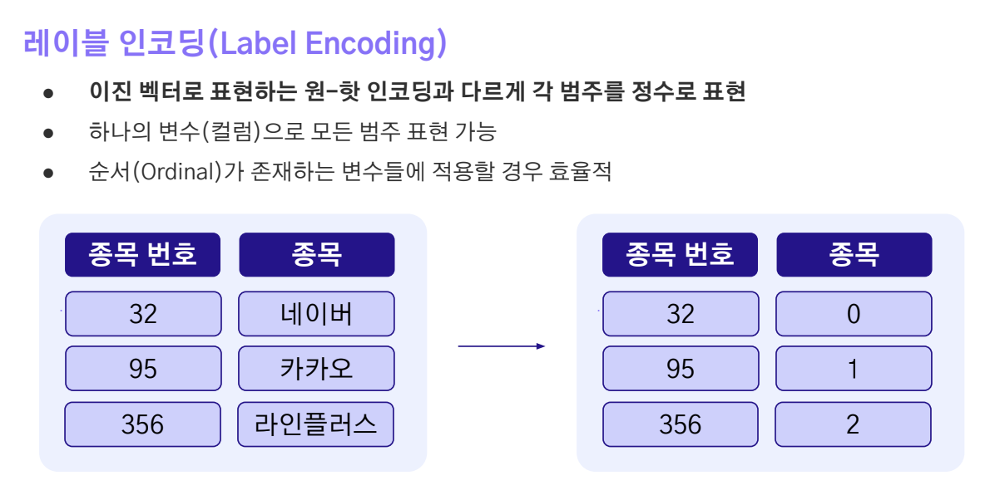

In [ ]:
# 파생변수 제작으로 추가된 변수들이 존재하기에, 다시한번 연속형과 범주형 칼럼을 분리해주겠습니다.
continuous_columns_v2 = []
# timeseries_columns_v2 = []
categorical_columns_v2 = []

for column in dt_train.columns:
    if pd.api.types.is_numeric_dtype(dt_train[column]):
        continuous_columns_v2.append(column)
    # elif pd.api.types.is_datetime64_dtype(dt_train[column]):
    #     timeseries_columns_v2.append(column)
    else:
        categorical_columns_v2.append(column)

print("연속형 변수:", continuous_columns_v2)
# print("시계열 변수:", timeseries_columns_v2)
print("범주형 변수:", categorical_columns_v2)

연속형 변수: ['전용면적(㎡)', '층', '건축년도', 'k-전체동수', 'k-전체세대수', 'k-연면적', 'k-주거전용면적', 'k-관리비부과면적', 'k-전용면적별세대현황(60㎡이하)', 'k-전용면적별세대현황(60㎡~85㎡이하)', 'k-85㎡~135㎡이하', '건축면적', '주차대수', '좌표X', '좌표Y', 'target', '계약년', '계약월', '계약일', '강남여부', '신축여부']
범주형 변수: ['번지', '본번', '부번', '아파트명', '도로명', 'k-단지분류(아파트,주상복합등등)', 'k-전화번호', 'k-팩스번호', 'k-세대타입(분양형태)', 'k-관리방식', 'k-복도유형', 'k-난방방식', 'k-건설사(시공사)', 'k-시행사', 'k-사용검사일-사용승인일', 'k-수정일자', '고용보험관리번호', '경비비관리형태', '세대전기계약방법', '청소비관리형태', '기타/의무/임대/임의=1/2/3/4', '단지승인일', '사용허가여부', '관리비 업로드', '단지신청일', '구', '동']


In [ ]:
# 아래에서 범주형 변수들을 대상으로 레이블인코딩을 진행해 주겠습니다.

# 각 변수에 대한 LabelEncoder를 저장할 딕셔너리
label_encoders = {}

# Implement Label Encoding
for col in tqdm( categorical_columns_v2 ):
    lbl = LabelEncoder()

    # Label-Encoding을 fit
    lbl.fit(dt_train[col].astype(str))
    dt_train[col] = lbl.transform(dt_train[col].astype(str))
    label_encoders[col] = lbl           # 나중에 후처리를 위해 레이블인코더를 저장해주겠습니다.

    # Test 데이터에만 존재하는 새로 출현한 데이터를 신규 클래스로 추가해줍니다.
    for label in np.unique(dt_test[col]):
      if label not in lbl.classes_: # unseen label 데이터인 경우
        lbl.classes_ = np.append(lbl.classes_, label) # 미처리 시 ValueError발생하니 주의하세요!

    dt_test[col] = lbl.transform(dt_test[col].astype(str))

100%|██████████| 27/27 [00:13<00:00,  2.06it/s]


In [ ]:
dt_train.head(1)        # 레이블인코딩이 된 모습입니다.

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,좌표Y,단지신청일,target,구,동,계약년,계약월,계약일,강남여부,신축여부
0,4732,1149,1,610,79.97,3,1987,6176,3,470,...,37.476763,249,124000.0,0,8,2017,12,8,1,0


### 6.2. Model Training
- 위 데이터를 이용해 모델을 train 해보겠습니다. 모델은 LightGBM을 이용하겠습니다.
- Train과 Valid dataset을 분할하는 과정에서는 `holdout` 방법을 사용하겠습니다. 이 방법의 경우  대략적인 성능을 빠르게 확인할 수 있다는 점에서 baseline에서 사용해보도록 하겠습니다.
  - 이 후 추가적인 eda를 통해서 평가세트와 경향을 맞추거나 kfold와 같은 분포에 대한 고려를 추가할 수 있습니다.

In [ ]:
assert dt_train.shape[1] == dt_test.shape[1]          # train/test dataset의 shape이 같은지 확인해주겠습니다.

In [ ]:
# Target과 독립변수들을 분리해줍니다.
y_train = dt_train['target']
X_train = dt_train.drop(['target'], axis=1)

# Hold out split을 사용해 학습 데이터와 검증 데이터를 8:2 비율로 나누겠습니다.
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=2023)

In [ ]:
col_idxs = {}
for idx, col in enumerate(list(X_train.columns)):
    col_idxs[col] = idx

X_train2 = X_train.rename(columns = col_idxs)
X_val2 = X_val.rename(columns = col_idxs)

In [ ]:
# LGBMRegressor를 이용해 회귀 모델을 적합시키겠습니다.
model = lgb.LGBMRegressor(n_estimators=100000, metric="rmse")
model.fit(X_train2, y_train,
          eval_set=[(X_train2, y_train), (X_val2, y_val)],
          eval_metric = 'rmse',
          categorical_feature='auto',
          callbacks=[lgb.early_stopping(stopping_rounds=50),
                     lgb.log_evaluation(period=10, show_stdv=True)])
pred = model.predict(X_val2)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.496611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7053
[LightGBM] [Info] Number of data points in the train set: 895057, number of used features: 47
[LightGBM] [Info] Start training from score 58000.483999
Training until validation scores don't improve for 50 rounds
[10]	training's rmse: 27879.9	valid_1's rmse: 28120.2
[20]	training's rmse: 21227.3	valid_1's rmse: 21437.9
[30]	training's rmse: 17946.8	valid_1's rmse: 18167.4
[40]	training's rmse: 16272.2	valid_1's rmse: 16513.1
[50]	training's rmse: 15138.8	valid_1's rmse: 15394.5
[60]	training's rmse: 14356.4	valid_1's rmse: 14631.2
[70]	training's rmse: 13731	valid_1's rmse: 14015.2
[80]	training's rmse: 13234.6	valid_1's rmse: 13528.8
[90]	training's rmse: 12823.8	valid_1's rmse: 13125.9
[100]	training's rmse: 12460.7	valid_1's rmse: 12767.1
[110]	training's rmse: 12142.4	valid_1's rmse: 12451.

- LightGBM의 하이퍼파라미터도 데이터에 맞게 지정해줄 수 있습니다. 데이터에 맞는 하이퍼파라미터를 찾는 것도 성능 향상에 도움이 될 수 있습니다.

In [ ]:
# 회귀 관련 metric을 통해 train/valid의 모델 적합 결과를 관찰합니다.
print(f'RMSE test: {np.sqrt(metrics.mean_squared_error(y_val, pred))}')

RMSE test: 5975.117972998368


- 변수 중요도도 확인해보도록 하겠습니다.

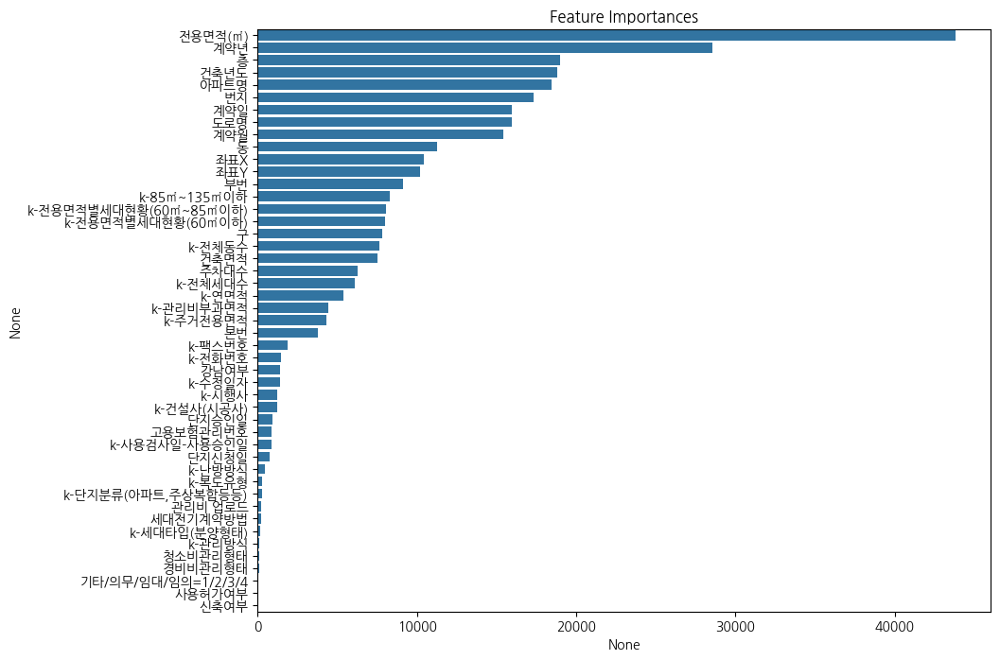

In [ ]:
# 위 feature importance를 시각화해봅니다.
importances = pd.Series(model.feature_importances_, index=list(X_train.columns))
importances = importances.sort_values(ascending=False)

plt.figure(figsize=(10,8))
plt.title("Feature Importances")
sns.barplot(x=importances, y=importances.index)
plt.show()

In [ ]:
# 학습된 모델을 저장합니다. Pickle 라이브러리를 이용하겠습니다.
with open('saved_model.pkl', 'wb') as f:
    pickle.dump(model, f)

- Metric visualize 확인해보도록 하겠습니다.

In [ ]:
import json
model_params = model.get_params()
print(json.dumps(model_params, indent=4)) # 보기 편하게 나타내기 위해, json 형태로 변환합니다.

{
    "boosting_type": "gbdt",
    "class_weight": null,
    "colsample_bytree": 1.0,
    "importance_type": "split",
    "learning_rate": 0.1,
    "max_depth": -1,
    "min_child_samples": 20,
    "min_child_weight": 0.001,
    "min_split_gain": 0.0,
    "n_estimators": 100000,
    "n_jobs": null,
    "num_leaves": 31,
    "objective": null,
    "random_state": null,
    "reg_alpha": 0.0,
    "reg_lambda": 0.0,
    "subsample": 1.0,
    "subsample_for_bin": 200000,
    "subsample_freq": 0,
    "metric": "rmse"
}


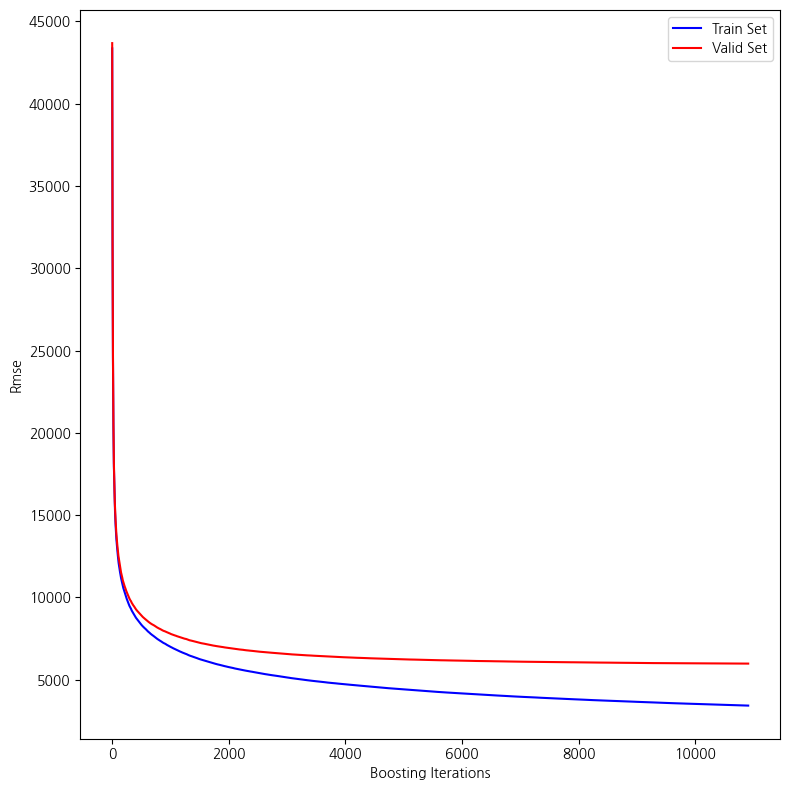

In [ ]:
# 학습결과를 시각화합니다.

fig = plt.figure(figsize=(8, 8))
plt.subplot(1, 1, 1)
plt.plot(np.arange(len(list(model.evals_result_['training']['rmse']))), list(model.evals_result_['training']['rmse']), 'b-',
         label='Train Set')
plt.plot(np.arange(len(list(model.evals_result_['training']['rmse']))), list(model.evals_result_['valid_1']['rmse']), 'r-',
         label='Valid Set')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Rmse')
fig.tight_layout()
plt.show()

### 6.3. Feature selection

- 어떤 변수가 유용한 변수인지 확인해보기 위해 permutation selection을 이용해보겠습니다.

In [ ]:
# # Permutation importance 방법을 변수 선택에 이용해보겠습니다.
# perm = PermutationImportance(model,        # 위에서 학습된 모델을 이용하겠습니다.
#                              scoring = 'neg_mean_squared_error',        # 평가 지표로는 회귀문제이기에 negative rmse를 사용합니다. (neg_mean_squared_error : 음의 평균 제곱 오차)
#                              random_state = 42,
#                              n_iter=3).fit(X_val2, y_val)
# eli5.show_weights(perm, feature_names = X_val.columns.tolist())    # valid data에 대해 적합시킵니다.

- 분석 결과 "계약년", "전용면적" 변수가 유의한 변수로 보입니다. 따라서 이 변수로 또 다른 파생변수를 더 생성해보거나, 중요도가 낮아보이는 변수를 제거해 차원의 저주를 막아볼 수도 있습니다.

### 6.4. Valid prediction 분석

- 예측값을 분석해보기 위해 valid prediction을 확인해보겠습니다.

In [ ]:
# Validation dataset에 target과 pred 값을 채워주도록 하겠습니다.
X_val['target'] = y_val
X_val['pred'] = pred

In [ ]:
# Squared_error를 계산하는 함수를 정의하겠습니다.
def calculate_se(target, pred):
    squared_errors = (target - pred) ** 2
    return squared_errors

# RMSE 계산
squared_errors = calculate_se(X_val['target'], X_val['pred'])
X_val['error'] = squared_errors

In [ ]:
# Error가 큰 순서대로 sorting 해 보겠습니다.
X_val_sort = X_val.sort_values(by='error', ascending=False)       # 내림차순 sorting

In [ ]:
X_val_sort.head()

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,구,동,계약년,계약월,계약일,강남여부,신축여부,target,pred,error
224567,745,222,0,394,273.960,16,2020,5895,0,1081,...,0,286,2022,4,28,1,1,1450000.0,984032.011169,2.171262e+11
221950,3113,826,0,2130,227.370,2,2019,8780,0,1081,...,20,312,2023,6,21,0,1,465000.0,885031.284668,1.764263e+11
534732,5784,1318,0,6212,244.749,3,2011,2507,3,577,...,20,312,2016,12,31,0,1,820000.0,507832.927359,9.744828e+10
138889,3734,921,177,5843,214.967,66,2004,6210,0,1081,...,0,63,2009,5,28,1,0,450000.0,177311.259601,7.435915e+10
534738,5784,1318,0,6212,233.062,3,2011,2507,3,577,...,20,312,2017,2,8,0,1,420000.0,655511.620369,5.546572e+10


- 예측을 잘 하지 못한 top 100개의 데이터와 예측을 잘한 top 100개의 데이터를 비교해보겠습니다.

In [ ]:
X_val_sort_top100 = X_val.sort_values(by='error', ascending=False).head(100)        # 예측을 잘 하지못한 top 100개의 data
X_val_sort_tail100 = X_val.sort_values(by='error', ascending=False).tail(100)       # 예측을 잘한 top 100개의 data

In [ ]:
# 해석을 위해 레이블인코딩 된 변수를 복원해줍니다.
error_top100 = X_val_sort_top100.copy()
for column in categorical_columns_v2 :     # 앞서 레이블 인코딩에서 정의했던 categorical_columns_v2 범주형 변수 리스트를 사용합니다.
    error_top100[column] = label_encoders[column].inverse_transform(X_val_sort_top100[column])

best_top100 = X_val_sort_tail100.copy()
for column in categorical_columns_v2 :     # 앞서 레이블 인코딩에서 정의했던 categorical_columns_v2 범주형 변수 리스트를 사용합니다.
    best_top100[column] = label_encoders[column].inverse_transform(X_val_sort_tail100[column])

In [ ]:
display(error_top100.head(1))
display(best_top100.head(1))

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,구,동,계약년,계약월,계약일,강남여부,신축여부,target,pred,error
224567,129,129.0,0.0,PH129,273.96,16,2020,압구정로79길 88,NULL,NULL,...,강남구,청담동,2022,4,28,1,1,1450000.0,984032.011169,2.171262e+11


,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,구,동,계약년,계약월,계약일,강남여부,신축여부,target,pred,error
754763,255,255.0,0.0,두산위브,84.4215,11,2005,증산서길 79,NULL,NULL,...,은평구,증산동,2014,12,6,0,0,42800.0,42799.092085,0.824309


- 이제 분포를 비교해보도록 하겠습니다.

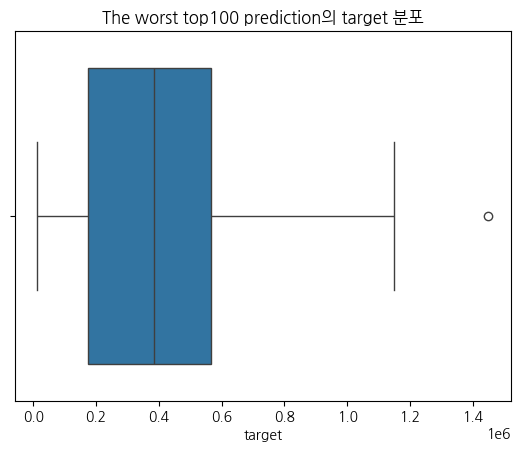

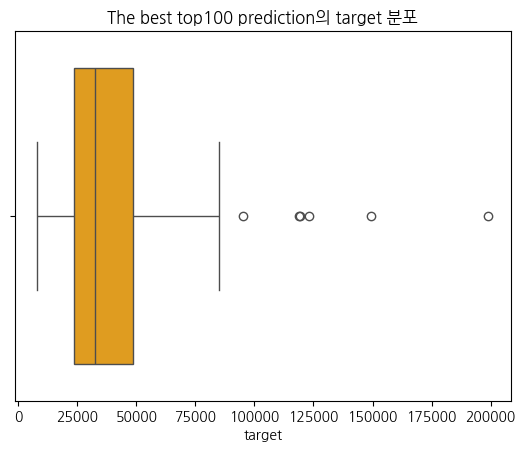

In [ ]:
sns.boxplot(data = error_top100, x='target')
plt.title('The worst top100 prediction의 target 분포')
plt.show()

sns.boxplot(data = best_top100, x='target', color='orange')
plt.title('The best top100 prediction의 target 분포')
plt.show()

- Taget 분포를 보니 좋은 예측을 보인 top 100개의 data보다 상대적으로 나쁜 예측을 보인 top 100 dataset들이 높은 가격을 보였음을 확인할 수 있습니다. 이에 대한 모델링 및 처리가 필요해보입니다.

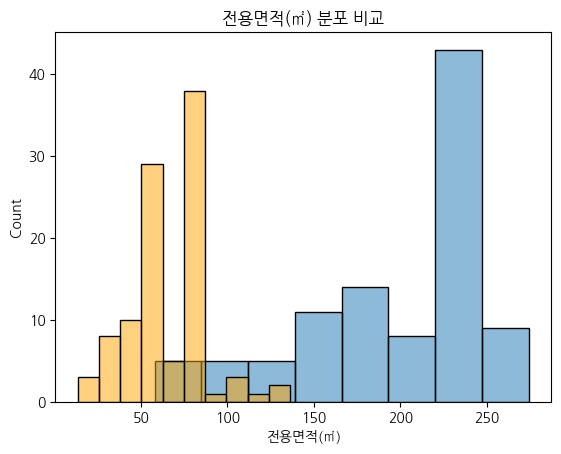

In [ ]:
sns.histplot(data = error_top100, x='전용면적(㎡)', alpha=0.5)
sns.histplot(data = best_top100, x='전용면적(㎡)', color='orange', alpha=0.5)
plt.title('전용면적(㎡) 분포 비교')
plt.show()

- 전용면적 또한 나쁜 예측을 보인 집들이 더 넓음을 확인할 수 있습니다.

## 7. Inference

In [ ]:
dt_test.head(2)      # test dataset에 대한 inference를 진행해보겠습니다.

,번지,본번,부번,아파트명,전용면적(㎡),층,건축년도,도로명,"k-단지분류(아파트,주상복합등등)",k-전화번호,...,좌표Y,단지신청일,target,구,동,계약년,계약월,계약일,강남여부,신축여부
0,4732,1149,1,610,79.9700,5,1987,6176,3,470,...,37.476763,249,0,0,8,2023,7,26,1,0
1,4707,1142,1,611,108.2017,10,2021,469,3,465,...,37.484892,243,0,0,8,2023,8,15,1,1


In [ ]:
# 저장된 모델을 불러옵니다.
with open('saved_model.pkl', 'rb') as f:
    model = pickle.load(f)

In [ ]:
%%time
X_test = dt_test.drop(['target'], axis=1)

X_test2 = X_test.rename(columns = col_idxs)

# Test dataset에 대한 inference를 진행합니다.
real_test_pred = model.predict(X_test2)

CPU times: user 6.62 s, sys: 13.9 ms, total: 6.63 s
Wall time: 6.65 s


In [ ]:
real_test_pred          # 예측값들이 출력됨을 확인할 수 있습니다.

array([177446.70673535, 265024.68584511, 319498.39423224, ...,
        80046.23456954,  55119.5884651 ,  62393.47941525])

## 8. Output File Save

In [ ]:
# 앞서 예측한 예측값들을 저장합니다.
preds_df = pd.DataFrame(real_test_pred.astype(int), columns=["target"])
preds_df.to_csv('output.csv', index=False)